In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/unknown_faces/Virat-Kohli-s-post-on-Twitter_1704ca5945b_medium.jpg
/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/unknown_faces/Kohli-Williamson.jpg
/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/unknown_faces/Virat-Kohli-3.jpg
/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/unknown_faces/gettyimages-1096362820-2048x2048.jpg
/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/unknown_faces/gettyimages-1160223387-2048x2048.jpg
/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/known_faces/Virat_Kohli/Virat-Kohli_16ada8548a7_large.jpg
/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/known_faces/Virat_Kohli/61QZdlk5FPL._SL1500_.jpg
/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/known_faces/Virat_Kohli/vk.jpg
/kaggle/input/vira

In [2]:
pip install face_recognition

     |████████████████████████████████| 100.1 MB 61.0 MB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566172 sha256=f8a6c868d0444173f9ee51cd6dafb21a683f1db69a29d72d2af6cbf0b1a40cce
  Stored in directory: /root/.cache/pip/wheels/d6/81/3c/884bcd5e1c120ff548d57c2ecc9ebf3281c9a6f7c0e7e7947a
Successfully built face-recognition-models
You should consider upgrading via the '/opt/conda/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
import cv2
import face_recognition

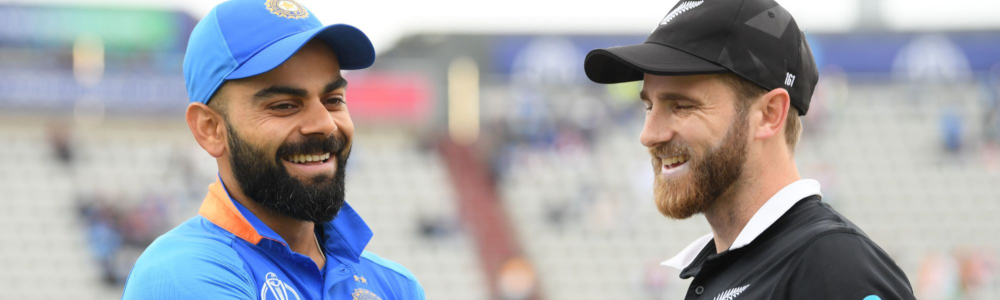

In [4]:
from PIL import Image, ImageDraw
from IPython.display import display

# Sample Image
virat_img = Image.open('/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/unknown_faces/Kohli-Williamson.jpg')
display(virat_img)

In [5]:
KNOWN_FACES_DIR = '/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/known_faces'
UNKNOWN_FACES_DIR = '/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/unknown_faces'
TOLERANCE = 0.6

In [6]:
print('Loading known faces...')
known_faces = []
known_names = []

Loading known faces...


In [7]:
for name in os.listdir(KNOWN_FACES_DIR):

    # Next we load every file of faces of known person
    for filename in os.listdir(f'{KNOWN_FACES_DIR}/{name}'):

        # Load an image
        image = face_recognition.load_image_file(f'{KNOWN_FACES_DIR}/{name}/{filename}')

        # Get 128-dimension face encoding
        # Always returns a list of found faces, for this purpose we take first face only (assuming one face per image as you can't be twice on one image)
        encoding = face_recognition.face_encodings(image)[0]

        # Append encodings and name
        known_faces.append(encoding)
        known_names.append(name)

In [8]:
print(known_names)

['Virat_Kohli', 'Virat_Kohli', 'Virat_Kohli', 'Virat_Kohli']


Filename Virat-Kohli-s-post-on-Twitter_1704ca5945b_medium.jpg

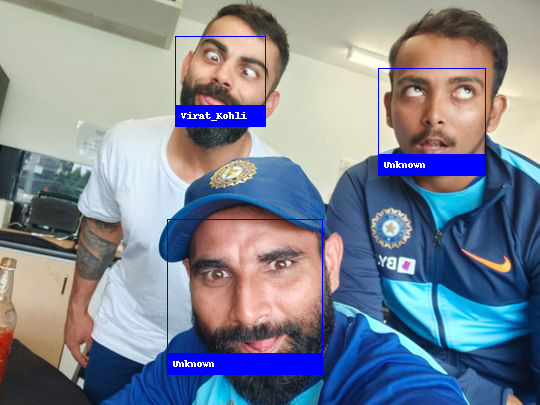

Filename Kohli-Williamson.jpg

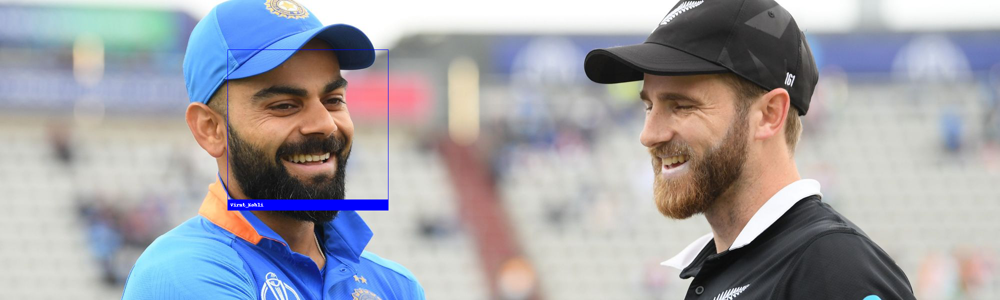

Filename Virat-Kohli-3.jpg

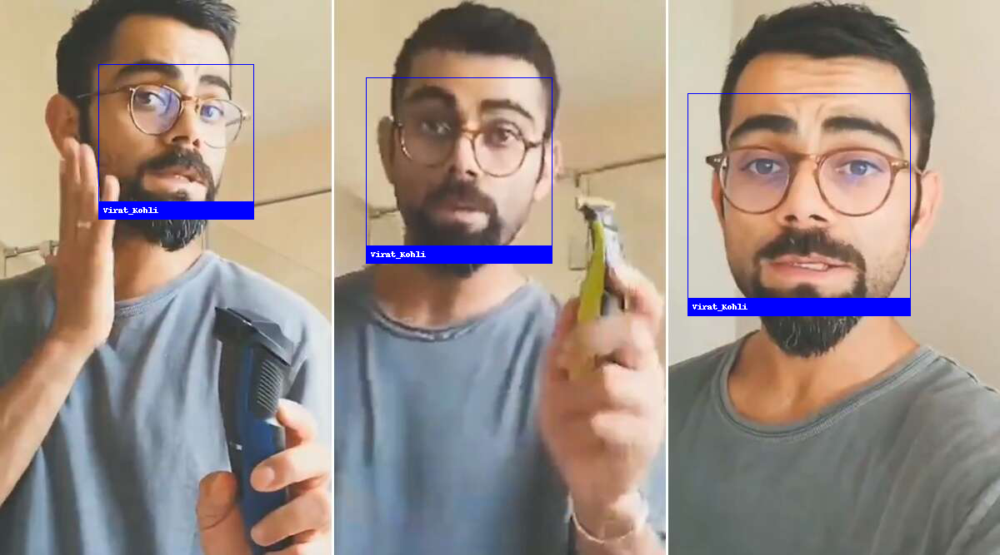

Filename gettyimages-1096362820-2048x2048.jpg

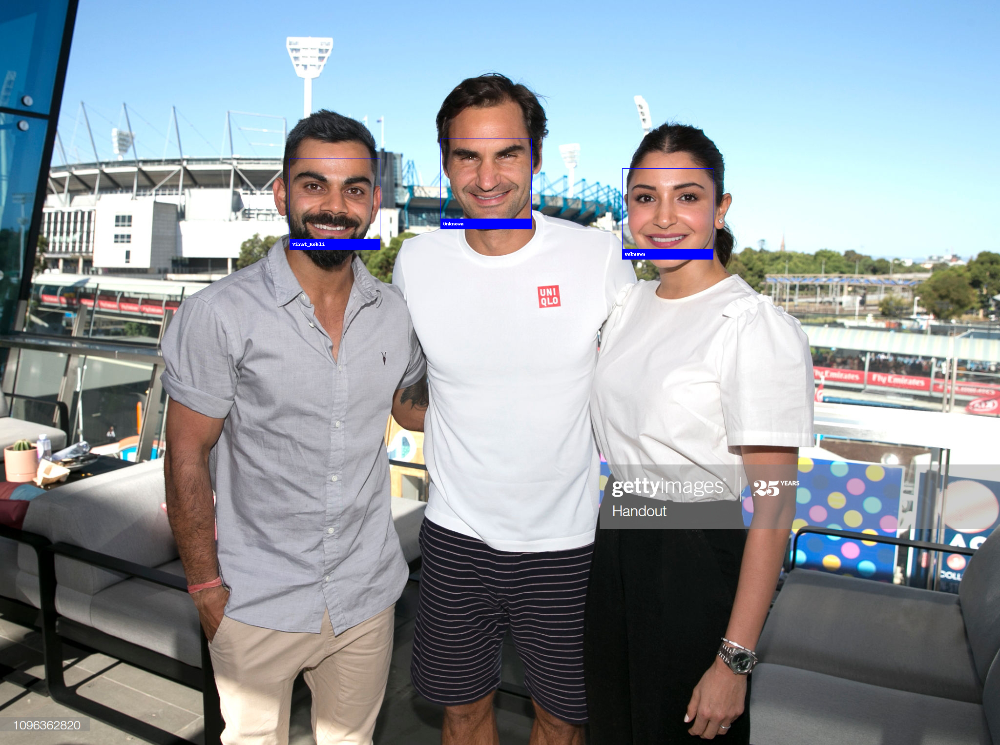

Filename gettyimages-1160223387-2048x2048.jpg

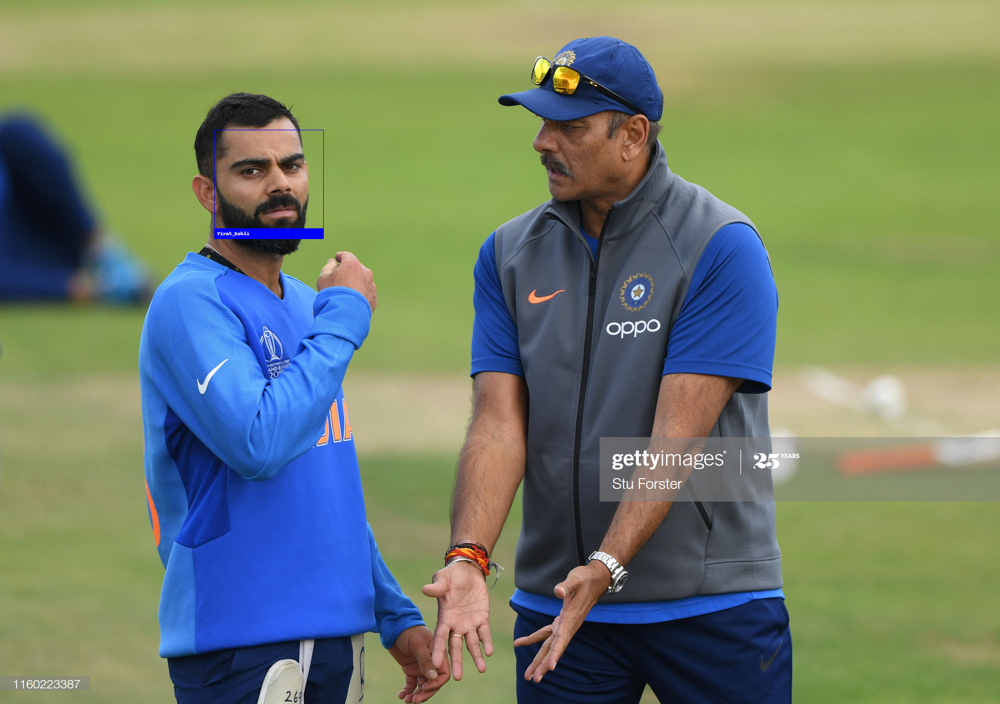

In [9]:
for filename in os.listdir(UNKNOWN_FACES_DIR):

    # Load image
    print(f'Filename {filename}', end='')
    unknown_image = face_recognition.load_image_file(f'{UNKNOWN_FACES_DIR}/{filename}')
    # Load an image with an unknown face
    #unknown_image = face_recognition.load_image_file("/kaggle/input/virat-kohli-facial-recognition/Virat Kohli Facial Recognition/known_faces/Virat_Kohli/gettyimages-463104486-2048x2048.jpg")

    # Find all the faces and face encodings in the unknown image
    face_locations = face_recognition.face_locations(unknown_image)
    face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

    # Convert the image to a PIL-format image so that we can draw on top of it with the Pillow library
    # See http://pillow.readthedocs.io/ for more about PIL/Pillow
    pil_image = Image.fromarray(unknown_image)
    # Create a Pillow ImageDraw Draw instance to draw with
    draw = ImageDraw.Draw(pil_image)

    # Loop through each face found in the unknown image
    for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
        # See if the face is a match for the known face(s)
        matches = face_recognition.compare_faces(known_faces, face_encoding,TOLERANCE)

        name = "Unknown"

        # Or instead, use the known face with the smallest distance to the new face
        face_distances = face_recognition.face_distance(known_faces, face_encoding)
        best_match_index = np.argmin(face_distances)
        if matches[best_match_index]:
            name = known_names[best_match_index]

        # Draw a box around the face using the Pillow module
        draw.rectangle(((left, top), (right, bottom)), outline=(0, 0, 255))

        # Draw a label with a name below the face
        text_width, text_height = draw.textsize(name)
        draw.rectangle(((left, bottom - text_height - 10), (right, bottom)), fill=(0, 0, 255), outline=(0, 0, 255))
        draw.text((left + 6, bottom - text_height - 5), name, fill=(255, 255, 255, 255))

    # Remove the drawing library from memory as per the Pillow docs
    del draw

    # Display the resulting image
    display(pil_image)